![ppt0](img/ppt0.JPG)

![ppt1](img/ppt1.JPG)

![ppt2](img/ppt2.JPG)

![ppt3](img/ppt3.JPG)

![timeline](img/timeline.JPG)

![ppt4](img/ppt4.JPG)

# Notebook Telstra Network Disruption

Predecir la gravedad de la falla en 3 niveles.

Datos obtenido de https://www.kaggle.com/c/telstra-recruiting-network

![telstra](img/telstra.png)

El objetivo del problema es predecir la gravedad del fallo de la red Telstra, en una ubicación determinada en función de los datos de registro disponibles. Cada fila del conjunto de datos principal (train.csv, test.csv) representa una ubicación y un punto de tiempo. Se identifican mediante la columna "id", que es la clave "id" utilizada en otros archivos de datos.

La gravedad de la falla tiene 3 categorías: 0,1,2 (0 significa sin falla, 1 significa sólo unas pocas, y 2 significa muchas).

![telstra](img/Optus-Mobile-Coverage-Map.jpg)


Diferentes tipos de características se extraen de archivos de registro y otras fuentes: event_type.csv, log_feature.csv, resource_type.csv severity_type.csv.

Nota: "severity_type" es una característica extraída de los archivos de registro (en severity_type.csv). A menudo se trata de un tipo de gravedad de un mensaje de advertencia procedente del registro. "severity_type" es categórico. "fault_severity" es una medición de los errores notificados reales de los usuarios de la red y es la variable de destino (en train.csv).

Descripcion de archivos

    train.csv - el conjunto de entrenamiento para la gravedad de la falla
    test.csv - el conjunto de pruebas para la gravedad del error
    sample_submission.csv - un archivo de envío de ejemplo
    event_type.csv - tipo de evento relacionado con el conjunto de datos principal
    log_feature.csv - características extraídas de archivos de registro
    resource_type.csv - tipo de recurso relacionado con el conjunto de datos principal
    severity_type.csv - tipo de gravedad de un mensaje de advertencia procedente del registro

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

from sklearn.metrics import classification_report

font = {'family' : 'sans',
        'weight' : 'bold',
        'size'   : 20}
plt.rc('font', **font)
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams[u'figure.figsize'] = (8,4)
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         }
# plt.style.use('seaborn-poster')
plt.style.use('ggplot')

# Descripcion de tablas

## Tabla Event_type

Corresponde a la tabla de tipo de evento que se sucito, relacionado con el  dataset principal

Se analizo por que habia en algunos casos 2 o 3 columnas y corresponde a eventos donde se susitaron dos eventos en el mismo id.

<img src="event_type_exp.png">

Solo corresponde al 8% de los eventos registrados por lo que __no__ se tomaran esos registros.

In [2]:
event_type = pd.read_csv("Datos/event_type.csv", error_bad_lines=False, warn_bad_lines=False)
event_type.drop(31170,inplace=True) # se quita por que tiene un error
event_type["id"] = event_type["id"].astype(int)


## Algunas funciones que nos podrian ayudar

In [3]:
def check_inicio_final(df,n=5):
    return pd.concat([df.head(n),df.tail(n)])

In [4]:
check_inicio_final(event_type)

,id,event_type
0,6597,event_type 11
1,8011,event_type 15
2,2597,event_type 15
3,5022,event_type 15
4,5022,event_type 11
31165,3761,event_type 11
31166,8720,event_type 11
31167,6488,event_type 11
31168,878,event_type 11
31169,4464,event_type 11


In [5]:
ProfileReport(event_type, title="Event type")

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
event_type["event_type"] = event_type.event_type.astype("category")

## Se repiten algunos ID's ojo al hacer el merge por que generan duplicados.

### Transformaciones a tipo de evento
Variable categorica nominal, se aplicara one hot encoding (pd.get_dummies)

In [7]:
event_type.event_type.value_counts(normalize=True).head()

event_type 11    0.253064
event_type 35    0.212223
event_type 34    0.190151
event_type 15    0.141001
event_type 20    0.046776
Name: event_type, dtype: float64

<AxesSubplot:title={'center':'Porcentaje de tipos de eventos'}>

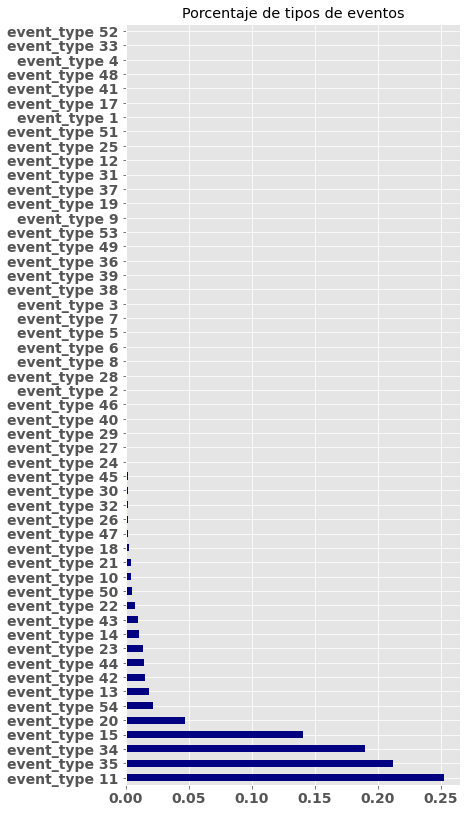

In [8]:
event_type.event_type.value_counts(normalize=True).plot.barh(
    color='navy', figsize=(6,14), title='Porcentaje de tipos de eventos')

Agruparemos los tipos de evento por que son un monton nos quedaremos con el top 20.

Se podria tomar un decil pero se dejara para despues

In [9]:
len(event_type.event_type.value_counts(normalize=True))

53

In [10]:
popular_events = event_type.event_type.value_counts().index.values[:25]

event_type["event_type_grouped"] = np.where(event_type.event_type.isin(
    popular_events),event_type.event_type,'others')

Text(0.5, 0, 'Porcentaje %')

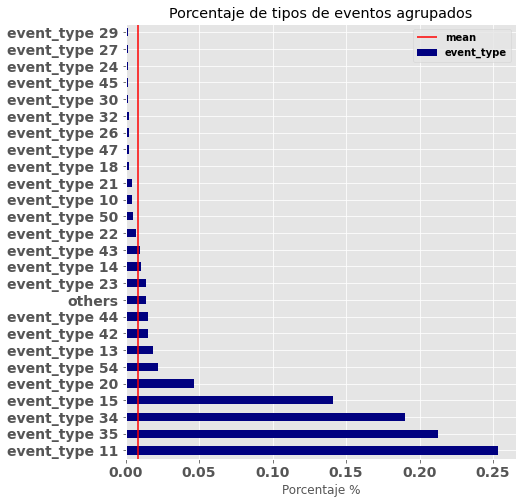

In [11]:
event_type.event_type_grouped.value_counts(normalize=True).plot.barh(color='navy', 
                          figsize=(7,8),
                          title='Porcentaje de tipos de eventos agrupados')
plt.vlines(event_type.event_type_grouped.value_counts(normalize=True).median(),
           plt.ylim()[0],plt.ylim()[1], color='r')
plt.legend(['mean','event_type',])
plt.xlabel('Porcentaje %')

In [12]:
# check de datos # solo se hara el join de la columna event_type_grouped
check_inicio_final(event_type)

,id,event_type,event_type_grouped
0,6597,event_type 11,event_type 11
1,8011,event_type 15,event_type 15
2,2597,event_type 15,event_type 15
3,5022,event_type 15,event_type 15
4,5022,event_type 11,event_type 11
31165,3761,event_type 11,event_type 11
31166,8720,event_type 11,event_type 11
31167,6488,event_type 11,event_type 11
31168,878,event_type 11,event_type 11
31169,4464,event_type 11,event_type 11


## Tabla Train

In [13]:
train = pd.read_csv("Datos/train.csv")
ProfileReport(train)

Summarize dataset:   0%|          | 0/16 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

7300 registros....

Como vimos aqui solo hay id's unicos y para colmo esta desbalanceado el problema... lo describiremos aqui abajo

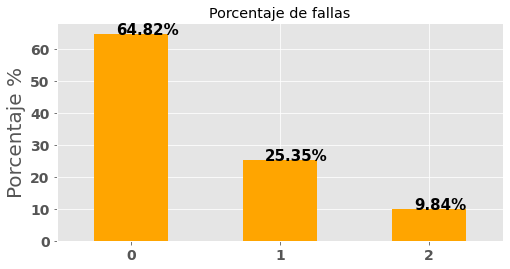

In [14]:
res = train.fault_severity.value_counts(normalize=True) * 100
res.plot.bar(rot=0, color='orange', title='Porcentaje de fallas')
plt.ylabel('Porcentaje %', fontsize=20)
for ind,i in enumerate(res.values):
    plt.text(ind-0.1,i,str(round(i,2))+'%', fontsize=15)

Recordar que:
+ 0 - leve
+ 1 - grave
+ 2 - Muy grave... casi explota o exploto :v

Una diferencia del 30 y 50 porciento !!! 

Posible aplicar un SMOTE para generar mas registros al entrenar el modelo.

Diccionario de datos train

    id:  identificador unico de lugar y tiempo
    location: identificador unico de ubicacion
    fault_severity: variable a predecir

In [15]:
# puede que exista una pequenia probabilidad de que sean ligares contiguos, 
# probabremos agregando la variable numerica de la ubicacion
train["location_numeric"] = train.location.str.split().str[1].astype(int)

<AxesSubplot:>

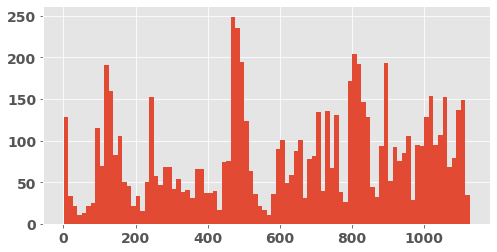

In [16]:
train.location_numeric.hist(bins=90)
# Parece que si hay lugares donde se conglomeran las fallas.

<AxesSubplot:xlabel='location_numeric', ylabel='fault_severity'>

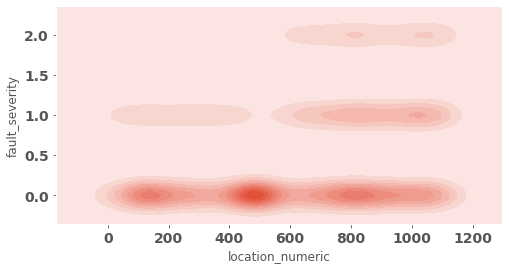

In [17]:
sns.kdeplot(train.location_numeric,train.fault_severity, shade=True)

Se concentran las severidades, dependiendo de la locacion, entonces si es importante ponerla como numerica

<AxesSubplot:xlabel='id', ylabel='fault_severity'>

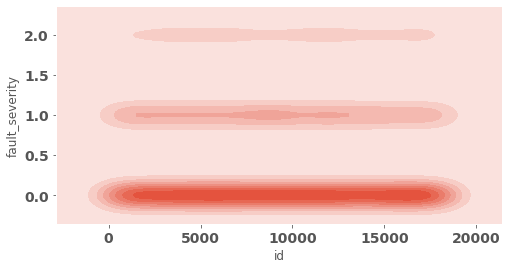

In [18]:
sns.kdeplot(train.id,train.fault_severity, shade=True)

Al parecer no hay relacion entre la severidad de la falla y el id.

In [19]:
check_inicio_final(train)

,id,location,fault_severity,location_numeric
0,14121,location 118,1,118
1,9320,location 91,0,91
2,14394,location 152,1,152
3,8218,location 931,1,931
4,14804,location 120,0,120
7376,870,location 167,0,167
7377,18068,location 106,0,106
7378,14111,location 1086,2,1086
7379,15189,location 7,0,7
7380,17067,location 885,0,885


In [20]:
train.shape

(7381, 4)

## severity_type

In [21]:
severity_type = pd.read_csv("Datos/severity_type.csv")
severity_type.head()

,id,severity_type
0,6597,severity_type 2
1,8011,severity_type 2
2,2597,severity_type 2
3,5022,severity_type 1
4,6852,severity_type 1


In [22]:
ProfileReport(severity_type)

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Por lo que veo solo hay 5 categorias y pondera la categoria 2 y 1. 

Podria intentar tratarla como variable ordinal o nominal... juuummm

+ nominal one hot encoding (dummies)
+ ordinal pues por el numero que tienen

In [23]:
# ordinal
severity_type["severety_type_ordinal"] = severity_type.severity_type.str.split().str[1].astype(int)

## Tabla log_feature

In [24]:
log_feature = pd.read_csv("Datos/log_feature.csv")

In [25]:
ProfileReport(log_feature)

Summarize dataset:   0%|          | 0/16 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

+ son un buen de log_features, tambien agruparlas en el top 20.
+ en volumne en el histograma vemos que hay outliers, re quitaran esos registros respetando el quantil 0.999

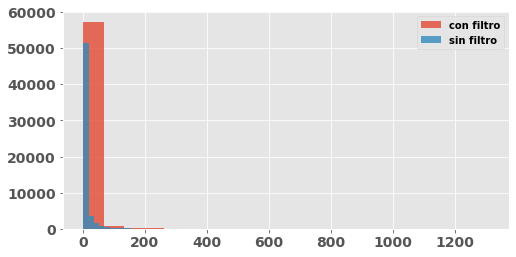

In [26]:
ax = log_feature.volume.hist(bins=20, alpha=0.8)
log_feature[log_feature.volume < log_feature.volume.quantile(0.999)].volume.hist(bins=20, alpha=0.8, ax=ax)
plt.legend(['con filtro','sin filtro'])

In [27]:
log_feature = log_feature[log_feature.volume < log_feature.volume.quantile(0.999)]

In [28]:
log_feature['log_volume'] = 1 + np.log(log_feature.volume)

<ipython-input-28-8a69d433d4d3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  log_feature['log_volume'] = 1 + np.log(log_feature.volume)


In [29]:
len(log_feature.log_feature.value_counts())

386

In [30]:
popular_log_features = log_feature.log_feature.value_counts().index.values[:100]

log_feature["log_features_grouped"] = np.where(log_feature.log_feature.isin(popular_log_features), log_feature.log_feature,'others')

<ipython-input-30-5968f506392e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  log_feature["log_features_grouped"] = np.where(log_feature.log_feature.isin(popular_log_features), log_feature.log_feature,'others')


Text(0.5, 0, 'Porcentaje %')

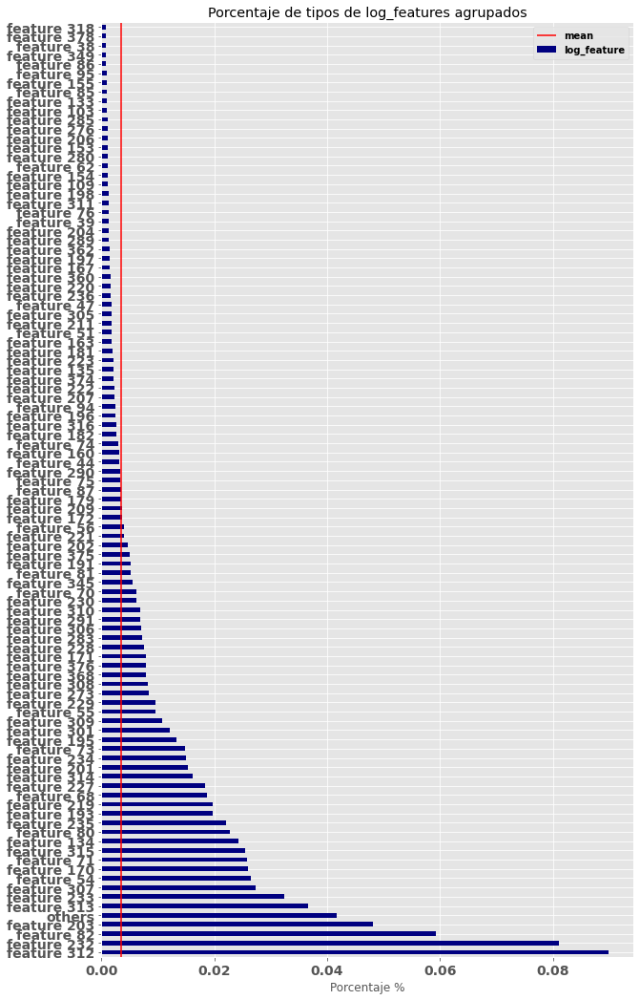

In [31]:
log_feature.log_features_grouped.value_counts(normalize=True).plot.barh(color='navy', 
                                                                        figsize=(10,18), title='Porcentaje de tipos de log_features agrupados')
plt.vlines(log_feature.log_features_grouped.value_counts(normalize=True).median(),plt.ylim()[0],plt.ylim()[1], color='r')
plt.legend(['mean','log_feature',])
plt.xlabel('Porcentaje %')

se ve horrible pero llega hasta 300 si se reduce el valor maximo.

Podemos obtener estadisticos sobre el volumen como el valor promedio con respecto al que tiene.

Asi como otras metricas. Como la diferencia del volumen con respecto al promedio de su feature.

In [32]:
# se quita el minimo por que no cambia con respecto a los demas
log_feature_stats = log_feature.groupby('log_features_grouped').volume.describe().drop('min',1)

In [33]:
log_feature_stats

,count,mean,std,25%,50%,75%,max
log_features_grouped,,,,,,,
feature 103,59.0,55.152542,79.505327,2.0,16.0,77.5,301.0
feature 109,66.0,27.924242,47.179627,2.0,6.0,31.0,226.0
feature 133,56.0,2.089286,1.760958,1.0,1.0,2.0,8.0
feature 134,1419.0,1.328400,1.441126,1.0,1.0,1.0,23.0
feature 135,126.0,1.190476,0.485210,1.0,1.0,1.0,3.0
...,...,...,...,...,...,...,...
feature 86,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0
feature 87,207.0,2.333333,3.318088,1.0,1.0,2.0,37.0
feature 94,140.0,1.485714,1.543078,1.0,1.0,1.0,15.0


Caracteristicas del feature

## Tabla resource_type

Esta tabla tiene columnas de mas en algunos registros que corresponde solo al 7% por lo que se eliminaran esos registros

In [34]:
resource_type = pd.read_csv("Datos/resource_type.csv", error_bad_lines=False, warn_bad_lines=False)
resource_type.drop(21076,inplace=True) # se quita por que tiene un error
resource_type.head()

,id,resource_type
0,6597,resource_type 8
1,8011,resource_type 8
2,2597,resource_type 8
3,5022,resource_type 8
4,6852,resource_type 8


In [35]:
resource_type.profile_report()

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Hay solo 10 tipos de recursos. Por lo que pueden utilizarse variables nominales, Se trataran como one hot encoding

# Preprocesamiento de datos y analisis subsecuente
Ahora si va el despapaye de datos a generar los joins y no tener duplicados OJO!!!! 

Por que aaaaa como son esos joins

    train.csv - the training set for fault severity
    event_type.csv - event type related to the main dataset LISTA
    log_feature.csv - features extracted from log files
    resource_type.csv - type of resource related to the main dataset
    severity_type.csv -  severity type of a warning message coming from the log
    
Ahi estan las tablas y las cruzaras todas por id

para las dummies tienes que agruparlas por id si no se friega por los duplicados

In [37]:
# se hara una funcion por que se repetira 3 veces
def get_dumi_dumi(df, col, idx):
    df_temp = pd.get_dummies(df, columns=[col]).groupby(idx).max()
    return df_temp

+ dummies de tipos de evento

Para extraer algunas variables es necesario preprocesar las variables categoricas nominales por lo que obtenemos variables dummies ed ellas

![dummies](img/var_cuali_01.png)

In [38]:
%%time
event_type_dummies = get_dumi_dumi(event_type,'event_type_grouped','id')

Wall time: 63.3 ms


In [39]:
check_inicio_final(event_type_dummies)

,event_type_grouped_event_type 10,event_type_grouped_event_type 11,event_type_grouped_event_type 13,event_type_grouped_event_type 14,event_type_grouped_event_type 15,event_type_grouped_event_type 18,event_type_grouped_event_type 20,event_type_grouped_event_type 21,event_type_grouped_event_type 22,event_type_grouped_event_type 23,...,event_type_grouped_event_type 34,event_type_grouped_event_type 35,event_type_grouped_event_type 42,event_type_grouped_event_type 43,event_type_grouped_event_type 44,event_type_grouped_event_type 45,event_type_grouped_event_type 47,event_type_grouped_event_type 50,event_type_grouped_event_type 54,event_type_grouped_others
id,,,,,,,,,,,,,,,,,,,,,
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
18548,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
18549,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,0
18550,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18551,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ numero de eventos en el mismo id

In [40]:
event_type_count = event_type.groupby('id').event_type.count().reset_index()
event_type_count.columns = ['id','number_of_event_types']
event_type_count.head()

,id,number_of_event_types
0,1,2
1,2,2
2,3,1
3,4,1
4,5,2


ya quedaron para hacer el merge. OJO al ponerle el nombre de las columnas 

+ dummie tipos de recursos

In [41]:
resource_type_dummies = get_dumi_dumi(resource_type,'resource_type','id')

In [42]:
check_inicio_final(resource_type_dummies)

,resource_type_resource_type 1,resource_type_resource_type 10,resource_type_resource_type 2,resource_type_resource_type 3,resource_type_resource_type 4,resource_type_resource_type 5,resource_type_resource_type 6,resource_type_resource_type 7,resource_type_resource_type 8,resource_type_resource_type 9
id,,,,,,,,,,
1,0,0,0,0,0,0,1,0,1,0
2,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0
4,0,0,1,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0
18548,0,0,1,0,0,0,0,0,0,0
18549,0,0,1,0,0,0,0,0,0,0
18550,0,0,0,0,0,0,0,0,1,0
18551,0,0,0,0,0,0,0,0,1,0


+ numero de recursos

In [43]:
resource_type_count = resource_type.groupby('id').resource_type.count().reset_index()
resource_type_count.columns = ['id','number_of_resource_type']
resource_type_count.head()

,id,number_of_resource_type
0,1,2
1,2,1
2,3,1
3,4,1
4,5,1


+ Gravedad de la falla en logs categorica Ordinal

In [44]:
# solo copiaremos esta
severity_type.severety_type_ordinal.head()

0    2
1    2
2    2
3    1
4    1
Name: severety_type_ordinal, dtype: int32

+ dummie log_features_agrupado

In [45]:
log_feature_dummi = get_dumi_dumi(log_feature,'log_features_grouped','id').drop([
    'volume','log_volume','log_feature'], 1)

In [46]:
check_inicio_final(log_feature_dummi)

,log_features_grouped_feature 103,log_features_grouped_feature 109,log_features_grouped_feature 133,log_features_grouped_feature 134,log_features_grouped_feature 135,log_features_grouped_feature 153,log_features_grouped_feature 154,log_features_grouped_feature 155,log_features_grouped_feature 160,log_features_grouped_feature 163,...,log_features_grouped_feature 76,log_features_grouped_feature 80,log_features_grouped_feature 81,log_features_grouped_feature 82,log_features_grouped_feature 85,log_features_grouped_feature 86,log_features_grouped_feature 87,log_features_grouped_feature 94,log_features_grouped_feature 95,log_features_grouped_others
id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18548,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18549,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18550,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18551,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ Conteo de log_features no es necesaria por que se hace en los estadisticos de abajo

+  Estadisticos de volumen

In [47]:
feature_vol_stats = log_feature.groupby('id').volume.describe()

In [48]:
feature_vol_stats.columns = ['log_feature_vol_count', 'log_feature_vol_mean', 
                                 'log_feature_vol_std', 'log_feature_vol_min', 'log_feature_vol_25%', 
                                 'log_feature_vol_50%', 'log_feature_vol_75%', 'log_feature_vol_max']

In [49]:
check_inicio_final(feature_vol_stats)

,log_feature_vol_count,log_feature_vol_mean,log_feature_vol_std,log_feature_vol_min,log_feature_vol_25%,log_feature_vol_50%,log_feature_vol_75%,log_feature_vol_max
id,,,,,,,,
1,3.0,1.666667,0.577350,1.0,1.50,2.0,2.00,2.0
2,5.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
3,1.0,2.000000,NaN,2.0,2.00,2.0,2.00,2.0
4,1.0,3.000000,NaN,3.0,3.00,3.0,3.00,3.0
5,2.0,8.500000,3.535534,6.0,7.25,8.5,9.75,11.0
18548,6.0,3.666667,0.516398,3.0,3.25,4.0,4.00,4.0
18549,6.0,1.333333,0.516398,1.0,1.00,1.0,1.75,2.0
18550,2.0,3.000000,0.000000,3.0,3.00,3.0,3.00,3.0
18551,2.0,3.500000,3.535534,1.0,2.25,3.5,4.75,6.0


+ Estadisticos de $Ln(1+volumne)$

In [50]:
feature_log_vol_stats = log_feature.groupby('id').log_volume.describe()

In [51]:
feature_log_vol_stats.columns = ['log_feature_logvol_count', 'log_feature_logvol_mean', 
                                 'log_feature_logvol_std', 'log_feature_logvol_min', 'log_feature_logvol_25%', 
                                 'log_feature_logvol_50%', 'log_feature_logvol_75%', 'log_feature_logvol_max']

In [52]:
check_inicio_final(feature_log_vol_stats)

,log_feature_logvol_count,log_feature_logvol_mean,log_feature_logvol_std,log_feature_logvol_min,log_feature_logvol_25%,log_feature_logvol_50%,log_feature_logvol_75%,log_feature_logvol_max
id,,,,,,,,
1,3.0,1.462098,0.400189,1.000000,1.346574,1.693147,1.693147,1.693147
2,5.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3,1.0,1.693147,NaN,1.693147,1.693147,1.693147,1.693147,1.693147
4,1.0,2.098612,NaN,2.098612,2.098612,2.098612,2.098612,2.098612
5,2.0,3.094827,0.428603,2.791759,2.943293,3.094827,3.246361,3.397895
18548,6.0,2.290400,0.148558,2.098612,2.170533,2.386294,2.386294,2.386294
18549,6.0,1.231049,0.357940,1.000000,1.000000,1.000000,1.519860,1.693147
18550,2.0,2.098612,0.000000,2.098612,2.098612,2.098612,2.098612,2.098612
18551,2.0,1.895880,1.266965,1.000000,1.447940,1.895880,2.343820,2.791759


# Hora de unir las tablas y analizar si hay patrones entre las nuevas variables

Merge dummies event type y train = df

In [53]:
# df = None #por si la riegas regresas aqui

In [54]:
df = train.merge(event_type_dummies, on='id', how='left')

In [55]:
print(len(train))
len(df)

7381


7381

In [56]:
df.head(2)

,id,location,fault_severity,location_numeric,event_type_grouped_event_type 10,event_type_grouped_event_type 11,event_type_grouped_event_type 13,event_type_grouped_event_type 14,event_type_grouped_event_type 15,event_type_grouped_event_type 18,...,event_type_grouped_event_type 34,event_type_grouped_event_type 35,event_type_grouped_event_type 42,event_type_grouped_event_type 43,event_type_grouped_event_type 44,event_type_grouped_event_type 45,event_type_grouped_event_type 47,event_type_grouped_event_type 50,event_type_grouped_event_type 54,event_type_grouped_others
0,14121,location 118,1,118,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
1,9320,location 91,0,91,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0


Merge numero de event type y df = df

In [57]:
df = df.merge(event_type_count, on='id', how='left')

In [58]:
print(len(train))
len(df)

7381


7381

Merge resource_type_dummies con df = df

In [59]:
df = df.merge(resource_type_dummies, on='id', how='left')

In [60]:
print(len(train))
len(df)

7381


7381

Merge resource_type_count con df = df

In [61]:
df = df.merge(resource_type_count, on='id', how='left')

In [62]:
print(len(train))
len(df)

7381


7381

Merge severery type ordinal con df = df

In [63]:
severity_type.head()

,id,severity_type,severety_type_ordinal
0,6597,severity_type 2,2
1,8011,severity_type 2,2
2,2597,severity_type 2,2
3,5022,severity_type 1,1
4,6852,severity_type 1,1


In [64]:
df = df.merge(severity_type[['id', 'severety_type_ordinal']], on='id', how='left')

In [65]:
print(len(train))
len(df)

7381


7381

Merge log_feature_dummies con df = df

In [66]:
df = df.merge(log_feature_dummi, on='id', how='left')

In [67]:
print(len(train))
len(df)

7381


7381

Merge log_feature_type_count con df = df

In [68]:
df = df.merge(feature_log_vol_stats, on='id', how='left')

In [69]:
df.columns

Index(['id', 'location', 'fault_severity', 'location_numeric',
       'event_type_grouped_event_type 10', 'event_type_grouped_event_type 11',
       'event_type_grouped_event_type 13', 'event_type_grouped_event_type 14',
       'event_type_grouped_event_type 15', 'event_type_grouped_event_type 18',
       ...
       'log_features_grouped_feature 95', 'log_features_grouped_others',
       'log_feature_logvol_count', 'log_feature_logvol_mean',
       'log_feature_logvol_std', 'log_feature_logvol_min',
       'log_feature_logvol_25%', 'log_feature_logvol_50%',
       'log_feature_logvol_75%', 'log_feature_logvol_max'],
      dtype='object', length=152)

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7381 entries, 0 to 7380
Columns: 152 entries, id to log_feature_logvol_max
dtypes: float64(109), int32(2), int64(4), object(1), uint8(36)
memory usage: 6.8+ MB


In [71]:
# numero de variables 
len(df.columns) - 2 

150

check si pegaron bien, parace que si

In [72]:
feature_log_vol_stats.loc[409]

log_feature_logvol_count    2.000000
log_feature_logvol_mean     1.895880
log_feature_logvol_std      0.286707
log_feature_logvol_min      1.693147
log_feature_logvol_25%      1.794513
log_feature_logvol_50%      1.895880
log_feature_logvol_75%      1.997246
log_feature_logvol_max      2.098612
Name: 409, dtype: float64

In [73]:
df[df.id == 409]

,id,location,fault_severity,location_numeric,event_type_grouped_event_type 10,event_type_grouped_event_type 11,event_type_grouped_event_type 13,event_type_grouped_event_type 14,event_type_grouped_event_type 15,event_type_grouped_event_type 18,...,log_features_grouped_feature 95,log_features_grouped_others,log_feature_logvol_count,log_feature_logvol_mean,log_feature_logvol_std,log_feature_logvol_min,log_feature_logvol_25%,log_feature_logvol_50%,log_feature_logvol_75%,log_feature_logvol_max
5550,409,location 808,0,808,0,1,0,0,1,0,...,0.0,0.0,2.0,1.89588,0.286707,1.693147,1.794513,1.89588,1.997246,2.098612


check de nulos

In [74]:
(1 - len(df.dropna()) / len(df))*100

13.399268391816832

El 13% de las columnas tiene nulos. se checara cuales registros se quitan y cuales se dejan y se rellenan

In [75]:
nul = df.isnull().sum()
nul[nul !=0 ]

log_features_grouped_feature 103    1
log_features_grouped_feature 109    1
log_features_grouped_feature 133    1
log_features_grouped_feature 134    1
log_features_grouped_feature 135    1
                                   ..
log_feature_logvol_min              1
log_feature_logvol_25%              1
log_feature_logvol_50%              1
log_feature_logvol_75%              1
log_feature_logvol_max              1
Length: 109, dtype: int64

In [76]:
# esta fila no tiene info relevante en log features, la quitare.
df[df.log_feature_logvol_min.isnull()]

,id,location,fault_severity,location_numeric,event_type_grouped_event_type 10,event_type_grouped_event_type 11,event_type_grouped_event_type 13,event_type_grouped_event_type 14,event_type_grouped_event_type 15,event_type_grouped_event_type 18,...,log_features_grouped_feature 95,log_features_grouped_others,log_feature_logvol_count,log_feature_logvol_mean,log_feature_logvol_std,log_feature_logvol_min,log_feature_logvol_25%,log_feature_logvol_50%,log_feature_logvol_75%,log_feature_logvol_max
2379,17078,location 12,0,12,0,1,0,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
df.drop(df[df.log_feature_logvol_min.isnull()].index, inplace=True)

In [78]:
nul = df.isnull().sum()
nul[nul !=0 ]

log_feature_logvol_std    988
dtype: int64

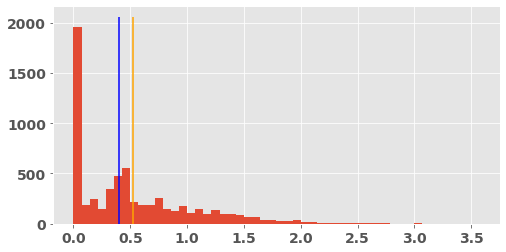

In [79]:
df.log_feature_logvol_std.hist(bins=50)
mi, ma = plt.ylim()
plt.vlines(df.log_feature_logvol_std.mean(), mi, ma, color='orange')
plt.vlines(df.log_feature_logvol_std.median(), mi, ma, color='blue')

In [80]:
df.log_feature_logvol_std.value_counts(normalize=True).head()

0.000000    0.286765
0.490129    0.055538
0.400189    0.035670
0.286707    0.015957
0.346574    0.012046
Name: log_feature_logvol_std, dtype: float64

### Se rellenara con 0's dado que son el 28 % de los datos y solo nos indicaria que no hay un cambio en el volumen en diversos eventos

In [81]:
df.fillna(0,inplace=True)

In [82]:
df[df.isnull().any(axis=1)]

,id,location,fault_severity,location_numeric,event_type_grouped_event_type 10,event_type_grouped_event_type 11,event_type_grouped_event_type 13,event_type_grouped_event_type 14,event_type_grouped_event_type 15,event_type_grouped_event_type 18,...,log_features_grouped_feature 95,log_features_grouped_others,log_feature_logvol_count,log_feature_logvol_mean,log_feature_logvol_std,log_feature_logvol_min,log_feature_logvol_25%,log_feature_logvol_50%,log_feature_logvol_75%,log_feature_logvol_max


## Analisis de variables nuevas

In [83]:
df[['id', 'location', 'fault_severity', 'location_numeric',
        'severety_type_ordinal','number_of_event_types',
        'log_feature_logvol_count',
       'log_feature_logvol_mean', 'log_feature_logvol_std',
       'log_feature_logvol_min', 'log_feature_logvol_25%',
       'log_feature_logvol_50%', 'log_feature_logvol_75%',
       'log_feature_logvol_max']].profile_report()

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [84]:
cols = ['id', 'location_numeric',
        'severety_type_ordinal','number_of_event_types',
        'log_feature_logvol_count',
       'log_feature_logvol_mean', 'log_feature_logvol_std',
       'log_feature_logvol_min', 'log_feature_logvol_25%',
       'log_feature_logvol_50%', 'log_feature_logvol_75%',
       'log_feature_logvol_max']

In [86]:
check_inicio_final(df[['id','location','location_numeric','fault_severity', 'severety_type_ordinal']][df.location_numeric == 1])

,id,location,location_numeric,fault_severity,severety_type_ordinal
144,8011,location 1,1,0,2
245,2588,location 1,1,0,1
395,14595,location 1,1,1,2
464,4848,location 1,1,0,1
845,5259,location 1,1,0,1
5970,16949,location 1,1,0,2
6017,16097,location 1,1,0,1
6553,6914,location 1,1,0,1
6635,2250,location 1,1,0,1
7333,1849,location 1,1,0,2


In [87]:
check_inicio_final(df[['id','location','location_numeric','fault_severity', 'severety_type_ordinal']].sort_values('location_numeric'),20)

,id,location,location_numeric,fault_severity,severety_type_ordinal
3616,2906,location 1,1,0,2
4239,1247,location 1,1,0,1
1148,15952,location 1,1,1,1
7333,1849,location 1,1,0,2
928,5337,location 1,1,0,1
919,3952,location 1,1,1,1
395,14595,location 1,1,1,2
5109,8148,location 1,1,1,1
6635,2250,location 1,1,0,1
4079,5280,location 1,1,1,1


In [90]:
df.columns = df.columns.str.replace(" ","_")

## Hora del entrenamiento 

In [91]:
# preprocesamiento de datos
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

#tuneo de metaparametros
from sklearn.model_selection import GridSearchCV

# Modelos
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier

# metricas de evaluacion
from sklearn.metrics import (roc_auc_score, classification_report, confusion_matrix,
                            roc_curve, accuracy_score)
# lo mismo pero en grafico
import scikitplot as skplt

# Interpretacion
from sklearn.inspection import plot_partial_dependence
import shap

In [92]:
x_cols = ['location_numeric',
       'event_type_grouped_event_type_10',
       'event_type_grouped_event_type_11',
       'event_type_grouped_event_type_13',
       'event_type_grouped_event_type_14',
       'event_type_grouped_event_type_15',
       'event_type_grouped_event_type_18',
       'event_type_grouped_event_type_20',
       'event_type_grouped_event_type_21',
       'event_type_grouped_event_type_22',
       'event_type_grouped_event_type_23',
       'event_type_grouped_event_type_24',
       'event_type_grouped_event_type_26',
       'event_type_grouped_event_type_27',
       'event_type_grouped_event_type_29',
       'event_type_grouped_event_type_30',
       'event_type_grouped_event_type_32',
       'event_type_grouped_event_type_34',
       'event_type_grouped_event_type_35',
       'event_type_grouped_event_type_42',
       'event_type_grouped_event_type_43',
       'event_type_grouped_event_type_44',
       'event_type_grouped_event_type_45',
       'event_type_grouped_event_type_47',
       'event_type_grouped_event_type_50',
       'event_type_grouped_event_type_54', 'event_type_grouped_others',
       'number_of_event_types', 'resource_type_resource_type_1',
       'resource_type_resource_type_10', 'resource_type_resource_type_2',
       'resource_type_resource_type_3', 'resource_type_resource_type_4',
       'resource_type_resource_type_5', 'resource_type_resource_type_6',
       'resource_type_resource_type_7', 'resource_type_resource_type_8',
       'resource_type_resource_type_9', 'number_of_resource_type',
       'severety_type_ordinal', 'log_features_grouped_feature_103',
       'log_features_grouped_feature_109',
       'log_features_grouped_feature_133',
       'log_features_grouped_feature_134',
       'log_features_grouped_feature_135',
       'log_features_grouped_feature_153',
       'log_features_grouped_feature_154',
       'log_features_grouped_feature_155',
       'log_features_grouped_feature_160',
       'log_features_grouped_feature_163',
       'log_features_grouped_feature_167',
       'log_features_grouped_feature_170',
       'log_features_grouped_feature_171',
       'log_features_grouped_feature_172',
       'log_features_grouped_feature_179',
       'log_features_grouped_feature_181',
       'log_features_grouped_feature_182',
       'log_features_grouped_feature_191',
       'log_features_grouped_feature_193',
       'log_features_grouped_feature_195',
       'log_features_grouped_feature_196',
       'log_features_grouped_feature_197',
       'log_features_grouped_feature_198',
       'log_features_grouped_feature_201',
       'log_features_grouped_feature_202',
       'log_features_grouped_feature_203',
       'log_features_grouped_feature_204',
       'log_features_grouped_feature_206',
       'log_features_grouped_feature_207',
       'log_features_grouped_feature_209',
       'log_features_grouped_feature_211',
       'log_features_grouped_feature_219',
       'log_features_grouped_feature_220',
       'log_features_grouped_feature_221',
       'log_features_grouped_feature_222',
       'log_features_grouped_feature_223',
       'log_features_grouped_feature_227',
       'log_features_grouped_feature_228',
       'log_features_grouped_feature_229',
       'log_features_grouped_feature_230',
       'log_features_grouped_feature_232',
       'log_features_grouped_feature_233',
       'log_features_grouped_feature_234',
       'log_features_grouped_feature_235',
       'log_features_grouped_feature_236',
       'log_features_grouped_feature_273',
       'log_features_grouped_feature_276',
       'log_features_grouped_feature_280',
       'log_features_grouped_feature_283',
       'log_features_grouped_feature_285',
       'log_features_grouped_feature_289',
       'log_features_grouped_feature_290',
       'log_features_grouped_feature_291',
       'log_features_grouped_feature_301',
       'log_features_grouped_feature_305',
       'log_features_grouped_feature_306',
       'log_features_grouped_feature_307',
       'log_features_grouped_feature_308',
       'log_features_grouped_feature_309',
       'log_features_grouped_feature_310',
       'log_features_grouped_feature_311',
       'log_features_grouped_feature_312',
       'log_features_grouped_feature_313',
       'log_features_grouped_feature_314',
       'log_features_grouped_feature_315',
       'log_features_grouped_feature_316',
       'log_features_grouped_feature_318',
       'log_features_grouped_feature_345',
       'log_features_grouped_feature_349',
       'log_features_grouped_feature_360',
       'log_features_grouped_feature_362',
       'log_features_grouped_feature_368',
       'log_features_grouped_feature_374',
       'log_features_grouped_feature_375',
       'log_features_grouped_feature_376',
       'log_features_grouped_feature_378',
       'log_features_grouped_feature_38',
       'log_features_grouped_feature_39',
       'log_features_grouped_feature_44',
       'log_features_grouped_feature_47',
       'log_features_grouped_feature_51',
       'log_features_grouped_feature_54',
       'log_features_grouped_feature_55',
       'log_features_grouped_feature_56',
       'log_features_grouped_feature_62',
       'log_features_grouped_feature_68',
       'log_features_grouped_feature_70',
       'log_features_grouped_feature_71',
       'log_features_grouped_feature_73',
       'log_features_grouped_feature_74',
       'log_features_grouped_feature_75',
       'log_features_grouped_feature_76',
       'log_features_grouped_feature_80',
       'log_features_grouped_feature_81',
       'log_features_grouped_feature_82',
       'log_features_grouped_feature_85',
       'log_features_grouped_feature_86',
       'log_features_grouped_feature_87',
       'log_features_grouped_feature_94',
       'log_features_grouped_feature_95', 'log_features_grouped_others',
       'log_feature_logvol_count', 'log_feature_logvol_mean',
       'log_feature_logvol_std', 'log_feature_logvol_min',
       'log_feature_logvol_25%', 'log_feature_logvol_50%',
       'log_feature_logvol_75%', 'log_feature_logvol_max']

In [93]:
x_train_test, x_valid, y_train_test, y_valid = train_test_split(
    df[x_cols],
    df.fault_severity,
    test_size=0.1,
    random_state=8)

x_train, x_test, y_train, y_test = train_test_split(x_train_test, 
                                                    y_train_test,
                                                    test_size = 0.2,
                                                    random_state=10)

## SMOTE

Es una tecnica de balanceo de clases

![](img/smote.png)

In [94]:
from imblearn.over_sampling import SMOTE

In [95]:
smote = SMOTE('not majority')
x_sm, y_sm = smote.fit_sample(x_train,y_train)
x_sm = pd.DataFrame(x_sm, columns=x_cols)

Pass sampling_strategy=not majority as keyword args. From version 0.9 passing these as positional arguments will result in an error


In [96]:
smote = SMOTE('not majority')
x_test_sm, y_test_sm = smote.fit_sample(x_test,y_test)
x_test_sm = pd.DataFrame(x_test_sm, columns=x_cols)

Pass sampling_strategy=not majority as keyword args. From version 0.9 passing these as positional arguments will result in an error


In [97]:
pd.Series(y_test_sm).value_counts()

0    870
2    870
1    870
Name: fault_severity, dtype: int64

In [98]:
pd.Series(y_sm).value_counts()

0    3452
1    3452
2    3452
Name: fault_severity, dtype: int64

## Entrenamiento Light GBM

Este algoritmo se basa en los arboles de decision, Random Forest y GBM (Maquinas potenciadas por gradiente) y muy parecido a su hermano xgboost

La principal diferencia es que la particion de sus hojas la hace por hoja, en lugar de por niveles. Evitando el sobreajuste.

![lgbm](img/lgbm.png)

In [99]:
d_train = lgb.Dataset(x_sm, y_sm)
d_test = lgb.Dataset(x_test_sm, label=y_test_sm)

params = {}
params['learning_rate'] = 0.01
params['boosting_type'] = 'gbdt'
params['objective'] = 'multiclass'
params['num_class'] = 3
params['metric'] = 'multi_logloss'
params['sub_feature'] = 0.2
params['num_leaves'] = 50
params['min_data'] = 10
params['max_depth'] = 1000
params['num_iterations'] = 10000

clf = lgb.train(params, d_train, 100, valid_sets=[d_test], early_stopping_rounds=50,verbose_eval=10000)

Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7478
[LightGBM] [Info] Number of data points in the train set: 10356, number of used features: 149
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1009]	valid_0's multi_logloss: 0.44799


In [100]:
clf.num_trees()

3027

# Evaluacion modelo en valid!

In [101]:
y_pred=clf.predict(x_valid)
predictions = []

for x in y_pred:
    predictions.append(np.argmax(x))

<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

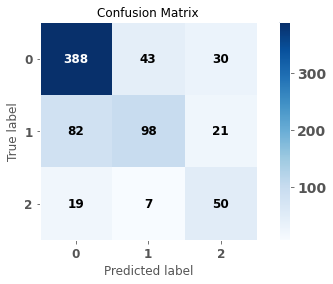

In [102]:
skplt.metrics.plot_confusion_matrix(y_valid,predictions,cmap='Blues',normalize=False,text_fontsize='large')

<AxesSubplot:title={'center':'Normalized Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

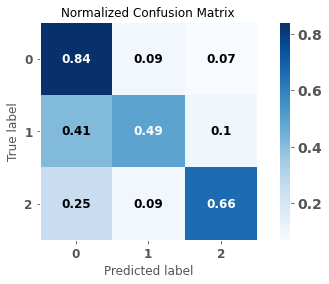

In [103]:
skplt.metrics.plot_confusion_matrix(y_valid,predictions,cmap='Blues',normalize=True,text_fontsize='large')

In [104]:
clf.best_score

defaultdict(collections.OrderedDict,
            {'valid_0': OrderedDict([('multi_logloss', 0.44798993071719495)])})

In [134]:
print(classification_report(y_valid,predictions))

              precision    recall  f1-score   support

           0       0.79      0.84      0.82       461
           1       0.66      0.49      0.56       201
           2       0.50      0.66      0.56        76

    accuracy                           0.73       738
   macro avg       0.65      0.66      0.65       738
weighted avg       0.73      0.73      0.72       738



## Interpretacion se hace en train

<AxesSubplot:title={'center':'Importancia de variables - Top 10'}, xlabel='Feature importance', ylabel='Features'>

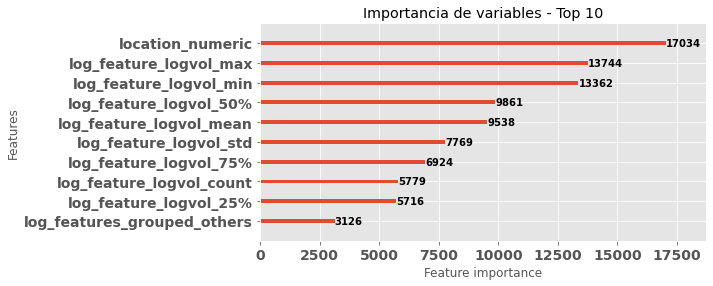

In [105]:
lgb.plot_importance(clf,max_num_features=10, title='Importancia de variables - Top 10')

In [135]:
f_imp = []
for i in zip(x_train.columns,clf.feature_importance()):
    f_imp.append(i)
    
importancia = pd.DataFrame(f_imp,columns=['col','value_imp']).sort_values(by='value_imp',ascending=False)
importancia = importancia.head(10)

In [137]:
pd.DataFrame(f_imp,columns=['col','value_imp']).sort_values(by='value_imp',ascending=False).head(10)

,col,value_imp
0,location_numeric,17034
148,log_feature_logvol_max,13744
144,log_feature_logvol_min,13362
146,log_feature_logvol_50%,9861
142,log_feature_logvol_mean,9538
143,log_feature_logvol_std,7769
147,log_feature_logvol_75%,6924
141,log_feature_logvol_count,5779
145,log_feature_logvol_25%,5716
140,log_features_grouped_others,3126


### SHAP

In [138]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(x_train)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [139]:
shap.initjs()

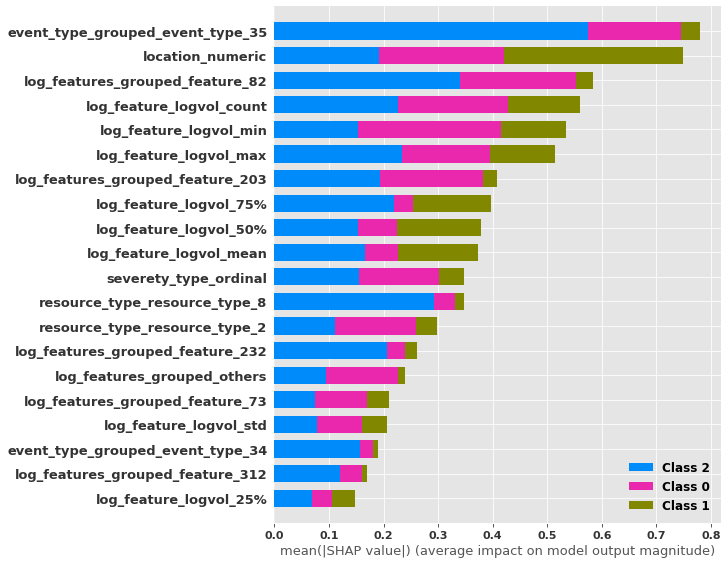

In [140]:
shap.summary_plot(shap_values, x_train)

In [ ]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(x_train)

In [165]:
x_train.iloc[500,:]

location_numeric                    849.000000
event_type_grouped_event_type_10      0.000000
event_type_grouped_event_type_11      1.000000
event_type_grouped_event_type_13      0.000000
event_type_grouped_event_type_14      0.000000
                                       ...    
log_feature_logvol_min                2.609438
log_feature_logvol_25%                2.848316
log_feature_logvol_50%                3.087194
log_feature_logvol_75%                3.326071
log_feature_logvol_max                3.564949
Name: 199, Length: 149, dtype: float64

In [146]:
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], x_train.iloc[10,:])

------

# guardado eL mejor modelo

In [ ]:
clf.save_model('light_gbm_magic_more_features.txt')
#load from model:

# Cargando el mejor modelo

In [ ]:
bst = lgb.Booster(model_file='light_gbm_magic_more_features.txt')